In [0]:
import cv2
import numpy as np
import imutils
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from skimage import io
from google.colab.patches import cv2_imshow
from scipy import ndimage

In [0]:
def url_to_image(url):
  return cv2.cvtColor(io.imread(url), cv2.COLOR_BGR2RGB)

def gray_scale_threshold_dilate(img, threshold, dilate_kernel):
  
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  thresh = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)[1]

  thresh = cv2.dilate(thresh, dilate_kernel, iterations=1) 
  
  return thresh

def find_contour_objects(thresholed_img, image):
  # find contours in the thresholded image
  cnts = cv2.findContours(thresholed_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  
  num = len(cnts)
  
  print("[INFO] {} unique contours found".format(num))

  # loop over the contours
  for (i, c) in enumerate(cnts):
    # draw the contour
    ((x, y), _) = cv2.minEnclosingCircle(c)
    cv2.putText(image, "#{}".format(i + 1), (int(x) - 10, int(y)),
      cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    cv2.drawContours(image, [c], -1, (0, 255, 0), 2)
  
  return num, image
  # show the output image
  cv2_imshow(image)
  

def find_num_of_obj_by_local_max(thresholed_img, min_dist):
  D = ndimage.distance_transform_edt(thresholed_img)
  localMax = peak_local_max(D, indices=False, min_distance=min_dist,
	labels=thresholed_img)
 
# perform a connected component analysis on the local peaks,
# using 8-connectivity, then appy the Watershed algorithm
  markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
  labels = watershed(-D, markers, mask=thresholed_img)
  num = len(np.unique(labels)) - 1
  print("[INFO] {} unique segments found".format(num))

  label_hue = np.uint8(179*labels/np.max(labels))
  blank_ch = 255*np.ones_like(label_hue)
  labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
  labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
  labeled_img[label_hue==0] = 0
  
  return num, labels, labeled_img


def draw_labels(labels, image, mask_size, put_text = False):
  for label in np.unique(labels):
    # if the label is zero, we are examining the 'background'
    # so simply ignore it
    if label == 0:
      continue

    # otherwise, allocate memory for the label region and draw
    # it on the mask
    mask = np.zeros(mask_size, dtype="uint8")
    mask[labels == label] = 255 
    #cv2_imshow(mask)#[labels == label] = 255   
    # detect contours in the mask and grab the largest one
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,
      cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)

    # draw a circle enclosing the object
    ((x, y), r) = cv2.minEnclosingCircle(c)
    cv2.circle(image, (int(x), int(y)), int(r), (0, 255, 0), 2)
    if put_text:
      cv2.putText(image, "#{}".format(label), (int(x) - 10, int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
 
  cv2_imshow(image)
  

In [0]:
class MeanShiftParameters:
  def __init__(self, spatial_win_radius=3, color_win_radius=100):
    self.spatial_win_radius = spatial_win_radius
    self.color_win_radius = color_win_radius
    
class Parameters:
  def __init__(self, mean_shift_params = MeanShiftParameters(), 
               threshold = 70, 
               dilate_filter = np.ones((4, 4), np.uint8), 
               min_dist_loacal_max = 10):
    
    self.threshold = threshold
    self.dilate_filter = dilate_filter
    self.mean_shift_params = mean_shift_params
    self.min_dist_loacal_max = min_dist_loacal_max

In [0]:
def find_num_objs_process(image_url, parameters):
  image = url_to_image(image_url)
  print("\nOriginal image")
  cv2_imshow(image)
  
  shifted = cv2.pyrMeanShiftFiltering(image, parameters.mean_shift_params.spatial_win_radius, parameters.mean_shift_params.color_win_radius)
  print("\nShifted image")
  cv2_imshow(shifted)
  
  
  thresh = gray_scale_threshold_dilate(shifted, parameters.threshold, parameters.dilate_filter )
  
  print("\nThresholded image")
  cv2_imshow(thresh)
  
  
  num_obj1, img_with_contours = find_contour_objects(thresh.copy(), image.copy())
  
  print(f"\nFound contours {num_obj1}")
  cv2_imshow(img_with_contours)
  
  num_obj2, labels, labeled_img = find_num_of_obj_by_local_max(thresholed_img=thresh, min_dist=parameters.min_dist_loacal_max)
  print(f"\nLabaled image. Found {num_obj2} objects")
  cv2_imshow(labeled_img)
  
  print(f"Detected {num_obj2} objects by labeled ")
  draw_labels(labels, image, thresh.shape, False)
  
  

#Count1 image



Original image


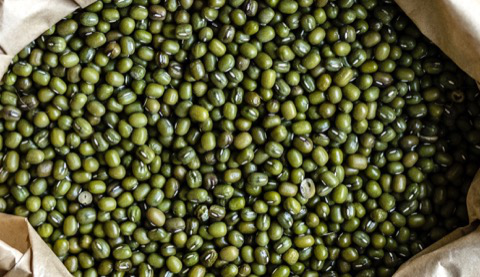


Shifted image


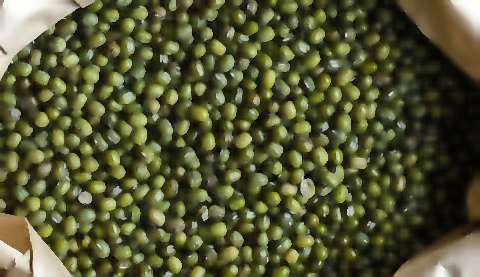


Thresholded image


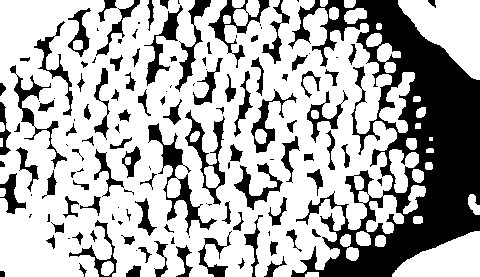

[INFO] 35 unique contours found

Found contours 35


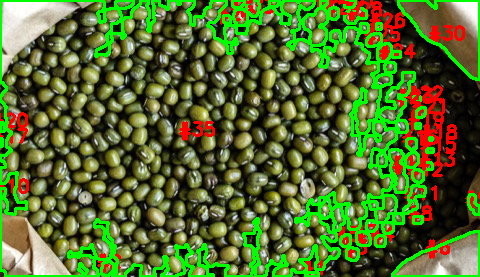

[INFO] 743 unique segments found

Labaled image. Found 743 objects


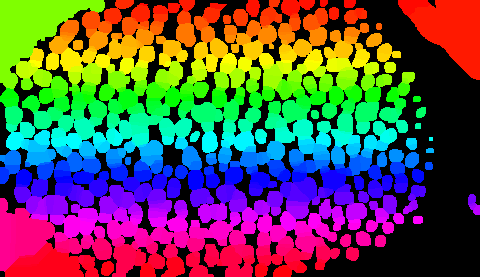

Detected 743 objects by labeled 


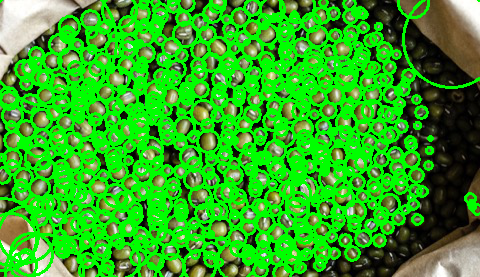

In [74]:
url1 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count1.jpg"
parameters1 = Parameters(min_dist_loacal_max=1)
find_num_objs_process(url1, parameters1)

Here, we can say approximatly, there is 743 unique objects

As we can see from above, this method does not give us so  true number of objects.


Here, we can say approximatly, there is 743 unique objects
[link text](https://)

#Count2 image





Original image


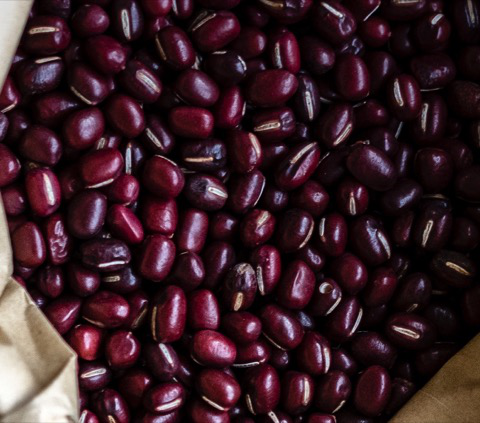


Shifted image


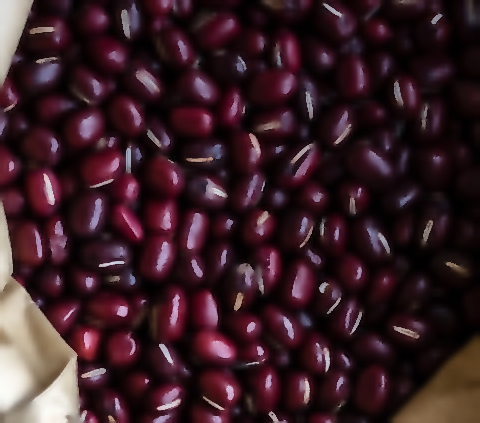


Thresholded image


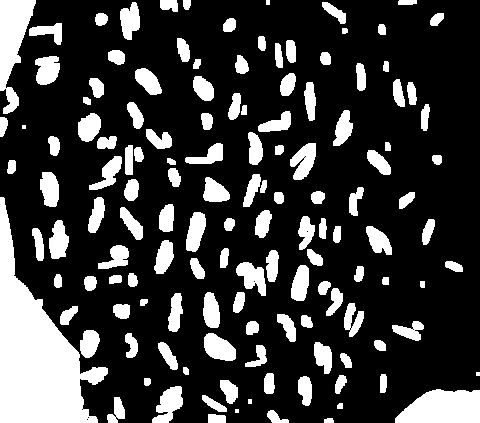

[INFO] 136 unique contours found

Found contours 136


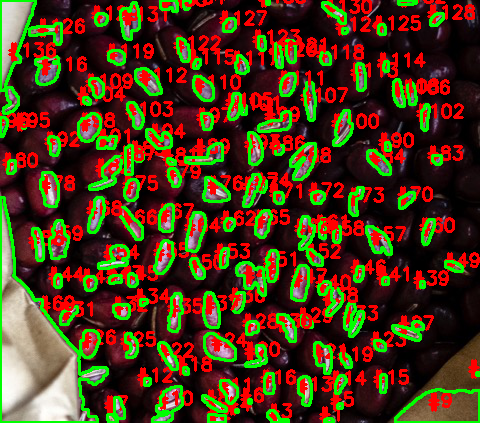

[INFO] 156 unique segments found

Labaled image. Found 156 objects


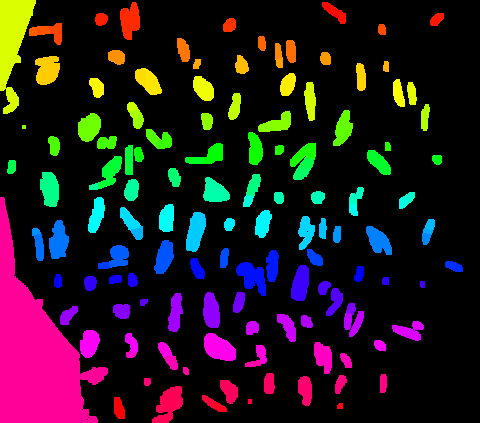

Detected 156 objects by labeled 


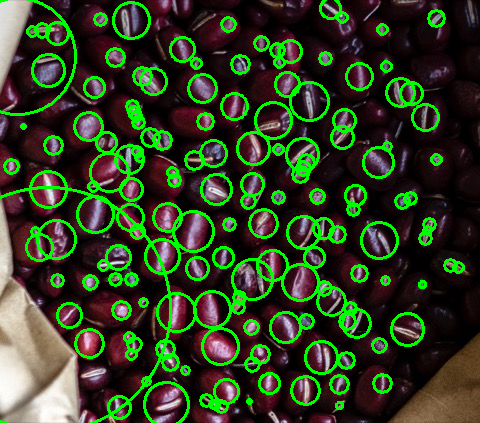

In [76]:
url2 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count2.jpg"
parameters2 = Parameters(min_dist_loacal_max=10)
find_num_objs_process(url2, parameters2)

As we can see from above two methods gave us similar results (131 and 152 objects). Approximately we can say that there are 152 objects.


#Count3 image



Original image


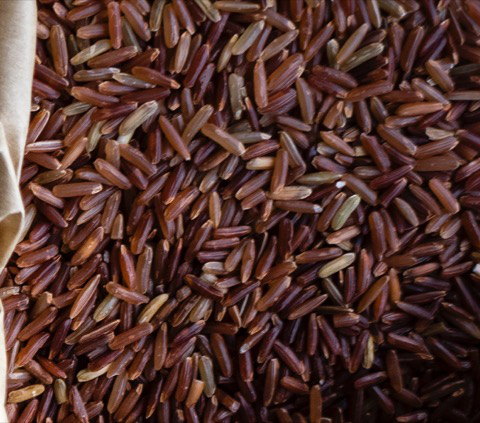


Shifted image


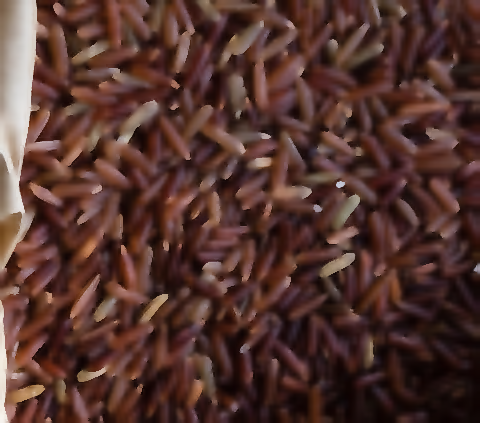


Thresholded image


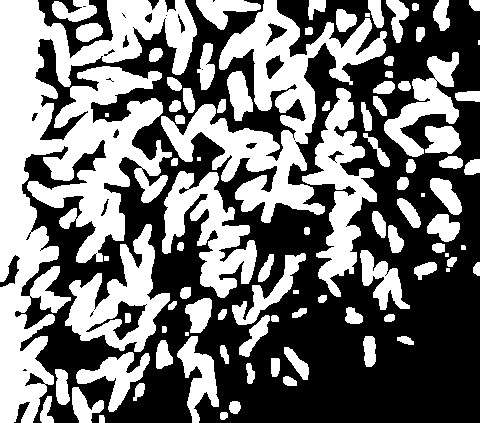

[INFO] 94 unique contours found

Found contours 94


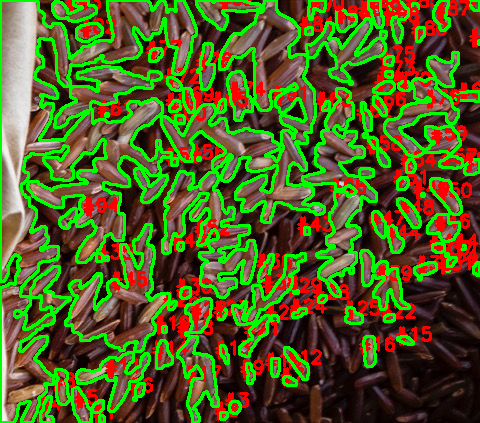

[INFO] 1025 unique segments found

Labaled image. Found 1025 objects


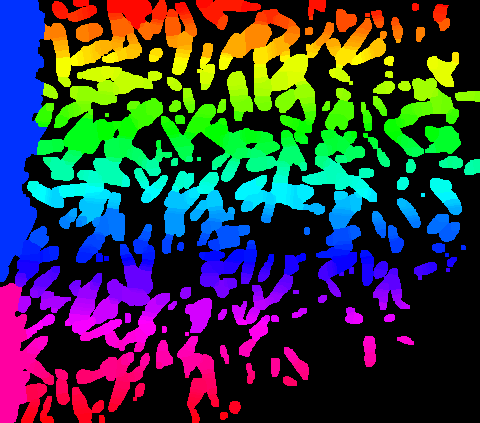

Detected 1025 objects by labeled 


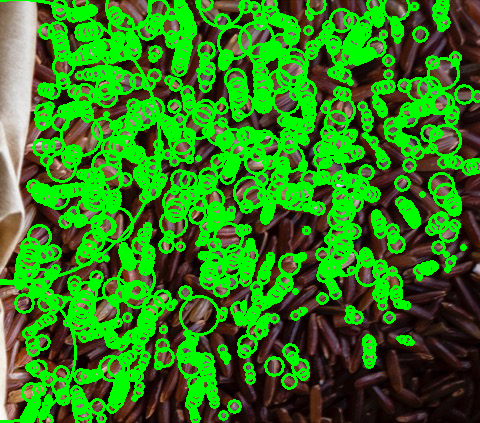

In [77]:
url3 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count3.jpg"
parameters3 = Parameters(min_dist_loacal_max=1)
find_num_objs_process(url3, parameters3)

From the labaled methd (see image above), we can approximately say that there are 1025 objects.

#Count4 image


Original image


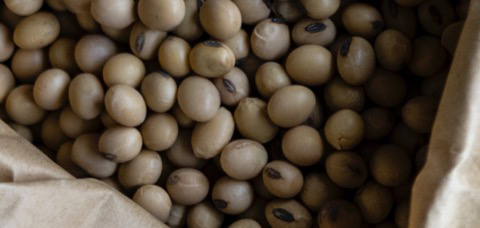


Shifted image


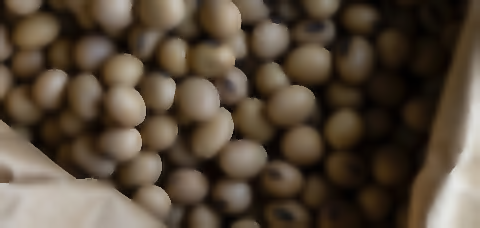


Thresholded image


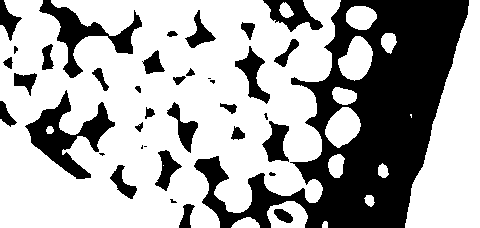

[INFO] 15 unique contours found

Found contours 15


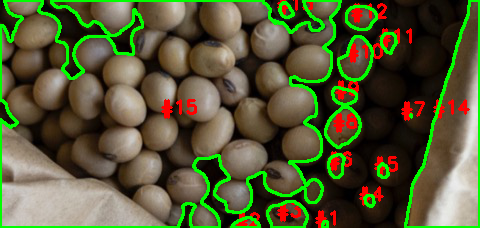

[INFO] 48 unique segments found

Labaled image. Found 48 objects


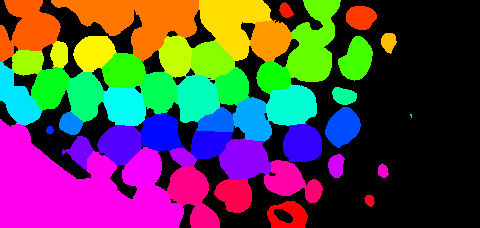

Detected 48 objects by labeled 


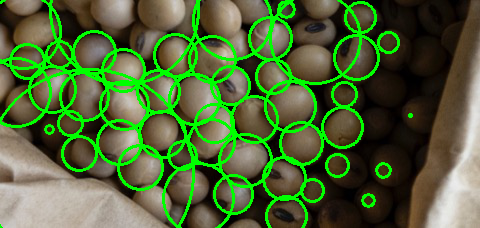

In [223]:
url4 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count4.jpg"
parameters4 = Parameters(threshold = 40, dilate_filter=np.ones((1, 1), np.uint8),  min_dist_loacal_max=10)
find_num_objs_process(url4, parameters4)

There are approximately 48 objects.


Original image


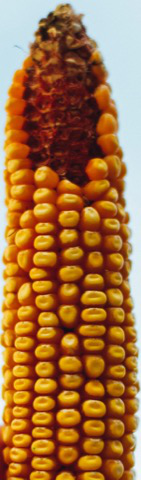


Shifted image


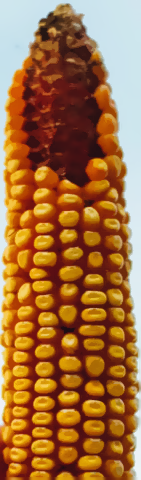


Thresholded image


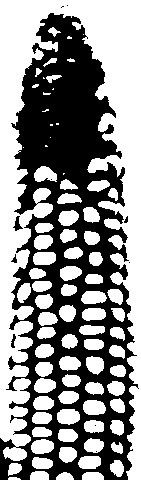

[INFO] 83 unique contours found

Found contours 83


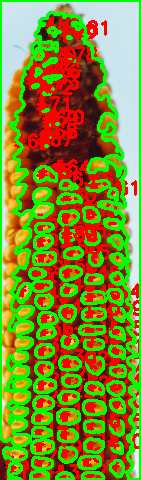

[INFO] 95 unique segments found

Labaled image. Found 95 objects


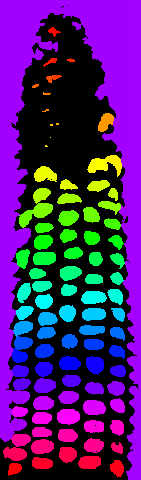

Detected 95 objects by labeled 


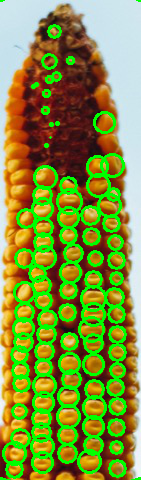

In [224]:
url5 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count5.jpg"
mean_shift_params5 = MeanShiftParameters(5, 21)
parameters5 = Parameters(mean_shift_params=mean_shift_params5, threshold=100, dilate_filter = np.ones((1, 1), np.uint8))
find_num_objs_process(url5, parameters5)

There is approximately 95 objects.


Original image


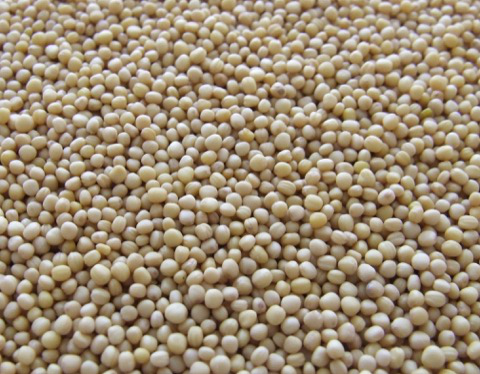


Shifted image


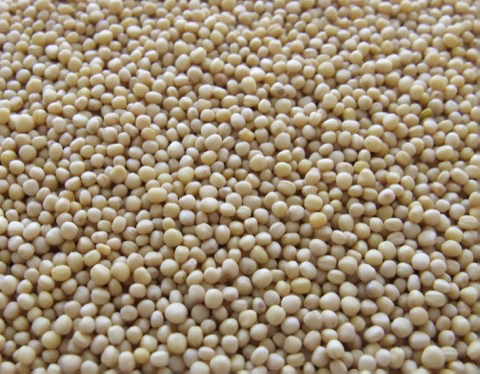


Thresholded image


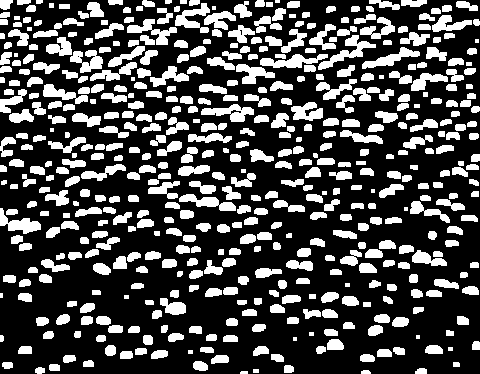

[INFO] 512 unique contours found

Found contours 512


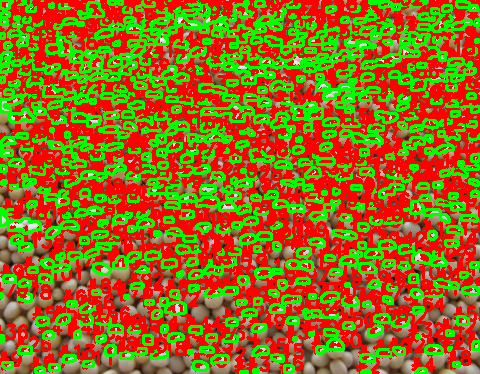

[INFO] 1189 unique segments found

Labaled image. Found 1189 objects


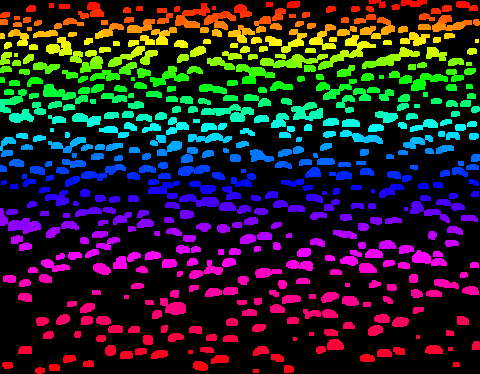

Detected 1189 objects by labeled 


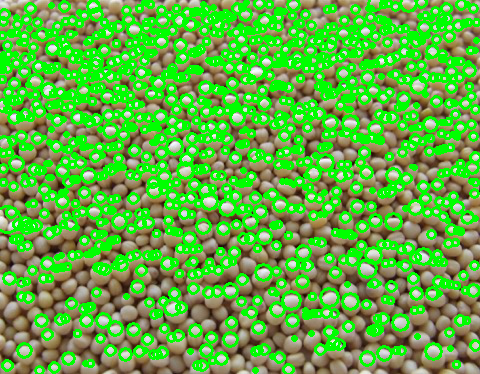

In [225]:
url6 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count6.jpg"
mean_shift_params6 = MeanShiftParameters(3, 10)
parameters6 = Parameters(mean_shift_params=mean_shift_params6, threshold=200, min_dist_loacal_max=1)
find_num_objs_process(url6, parameters6)

There are approximately 1189 objects.


Original image


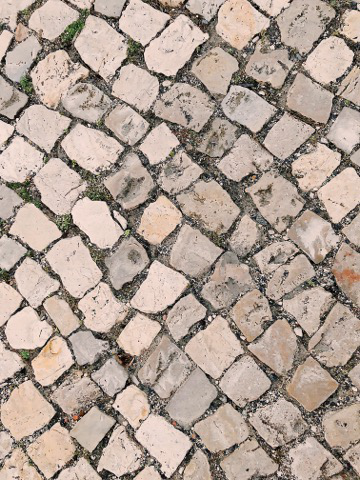


Shifted image


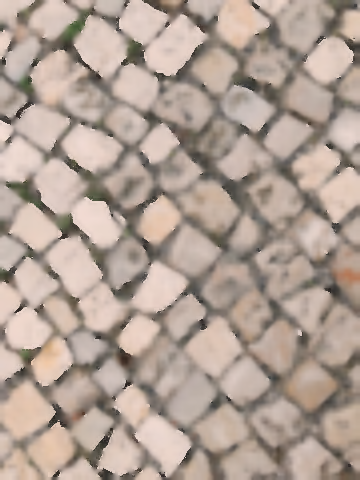


Thresholded image


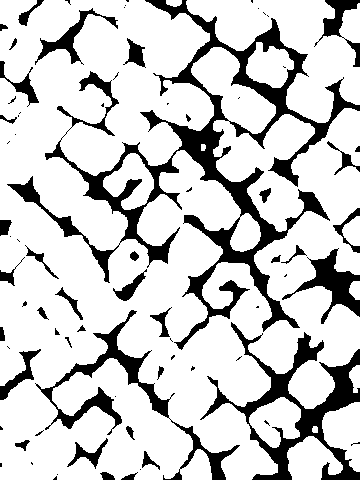

[INFO] 13 unique contours found

Found contours 13


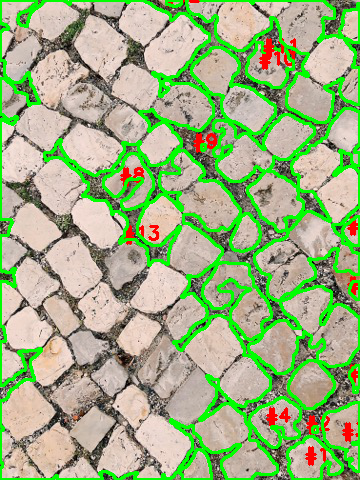

[INFO] 78 unique segments found

Labaled image. Found 78 objects


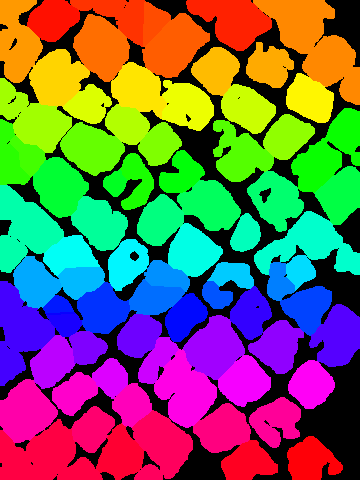

Detected 78 objects by labeled 


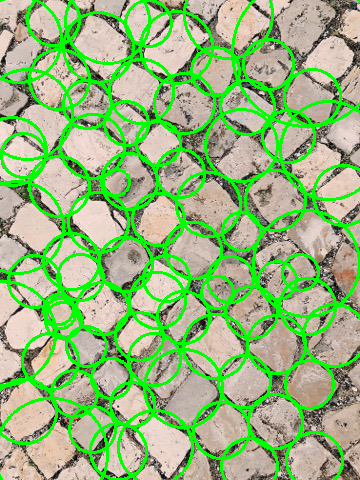

In [102]:
url7 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count7.jpg"
mean_shift_params7 = MeanShiftParameters(3, 150)
parameters7 = Parameters(mean_shift_params=mean_shift_params7, threshold=150, min_dist_loacal_max=15)
find_num_objs_process(url7, parameters7)

There are approximately 78 objects.


Original image


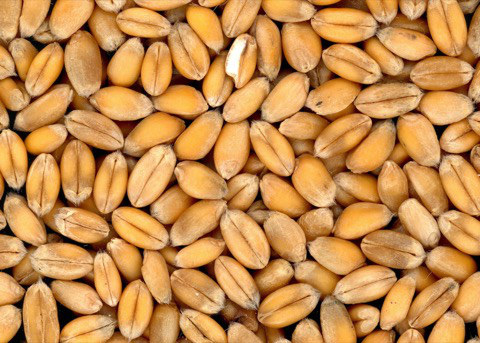


Shifted image


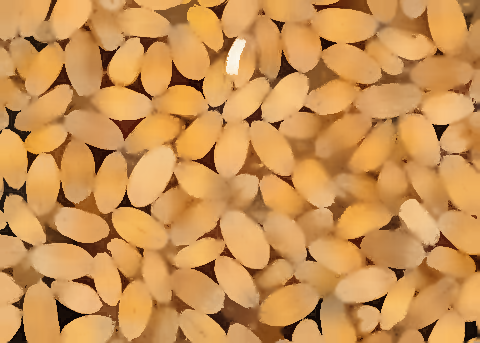


Thresholded image


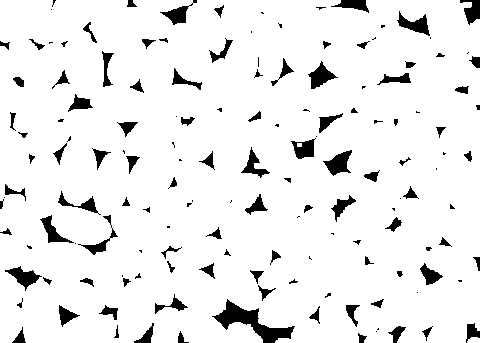

[INFO] 2 unique contours found

Found contours 2


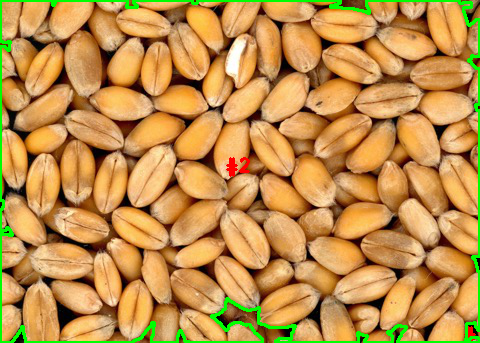

[INFO] 93 unique segments found

Labaled image. Found 93 objects


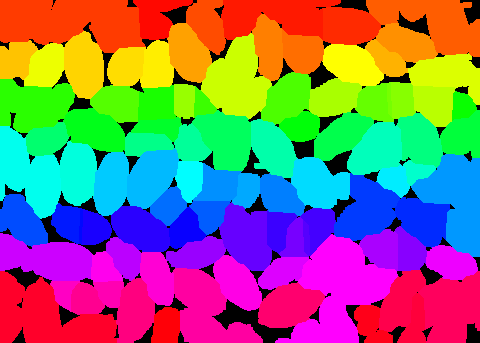

Detected 93 objects by labeled 


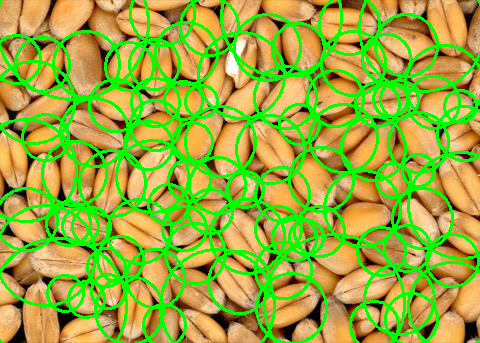

In [126]:
url8 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count8.jpg"
mean_shift_params8 = MeanShiftParameters(11, 100)
parameters8 = Parameters(mean_shift_params=mean_shift_params8, threshold=130, min_dist_loacal_max=10)
find_num_objs_process(url8, parameters8)

There are approximately 93 objects.


Original image


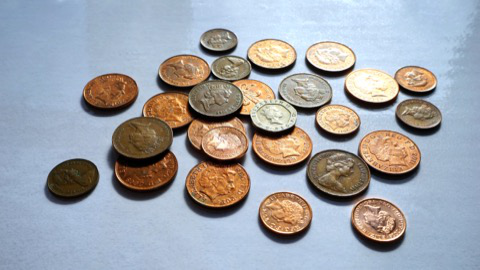


Shifted image


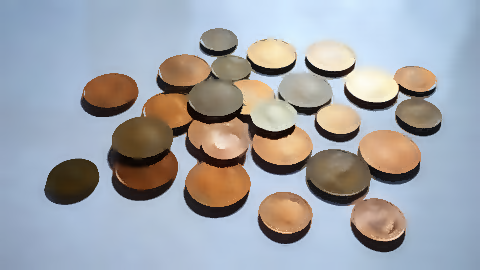


Thresholded image


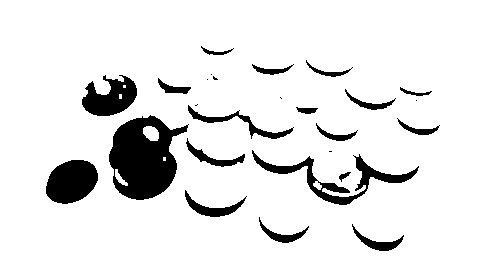

[INFO] 1 unique contours found

Found contours 1


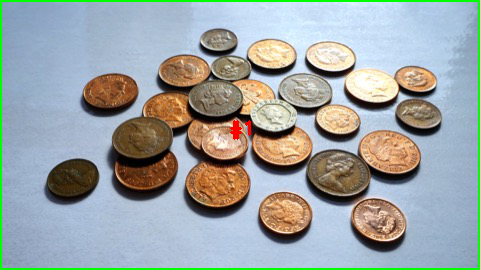

[INFO] 23 unique segments found

Labaled image. Found 23 objects


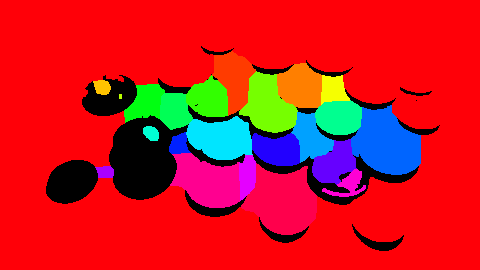

Detected 23 objects by labeled 


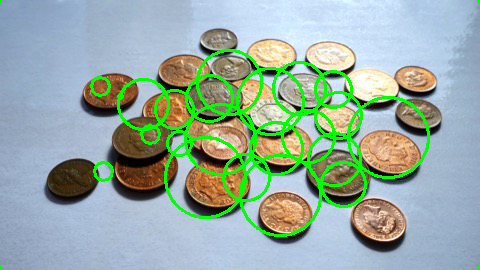

In [227]:
url9 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count9.jpg"
mean_shift_params9 = MeanShiftParameters(5, 75)
parameters9 = Parameters(mean_shift_params=mean_shift_params9, threshold=100, dilate_filter=np.ones((3, 3), np.uint8), min_dist_loacal_max=10)
find_num_objs_process(url9, parameters9)

There  are approximately 23 objects.

#Count10 image


Original image


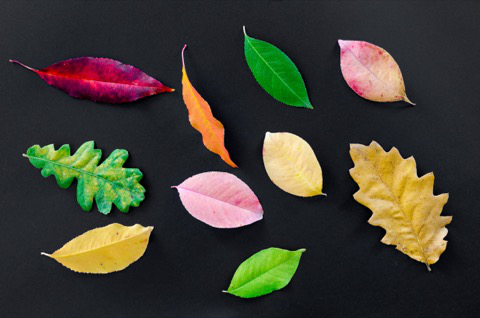


Shifted image


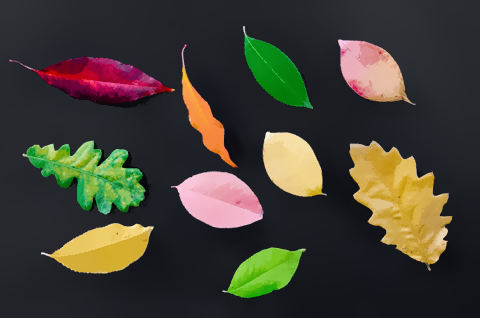


Thresholded image


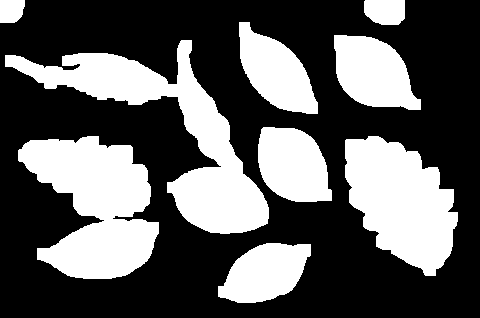

[INFO] 9 unique contours found

Found contours 9


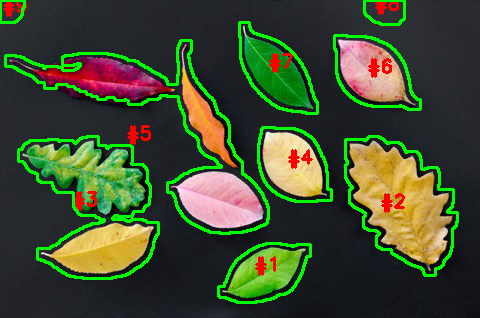

[INFO] 9 unique segments found

Labaled image. Found 9 objects


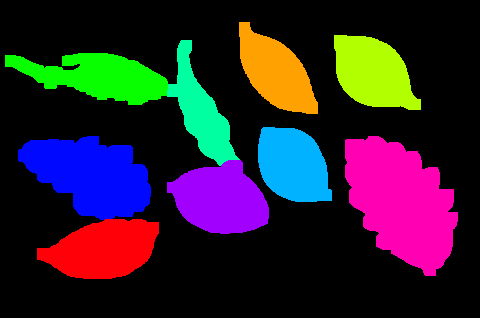

Detected 9 objects by labeled 


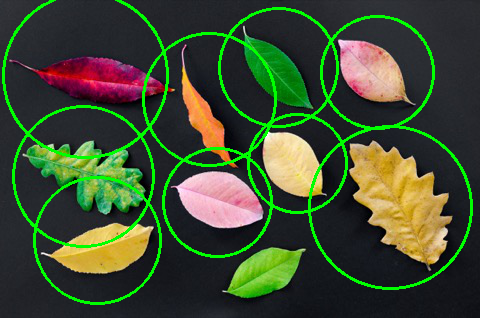

In [228]:
url10 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count10.jpg"
mean_shift_params10 = MeanShiftParameters(11, 21)
parameters10 = Parameters(mean_shift_params=mean_shift_params10, threshold=48, dilate_filter=np.ones((10, 10), np.uint8), min_dist_loacal_max=55)
find_num_objs_process(url10, parameters10)

There are found 9 objects.


#Count11 image


Original image


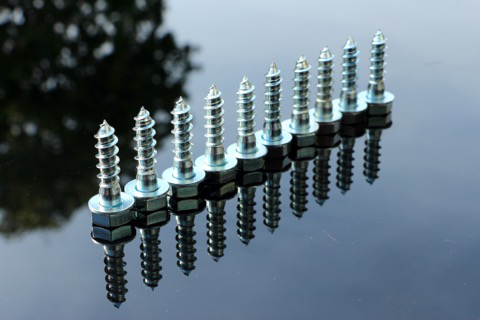


Shifted image


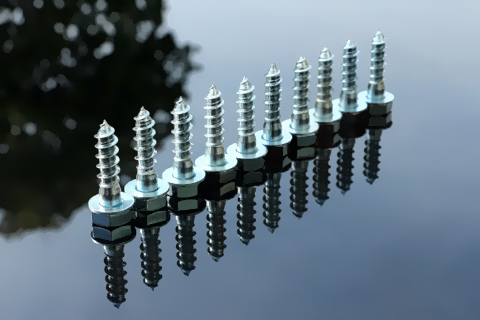


Thresholded image


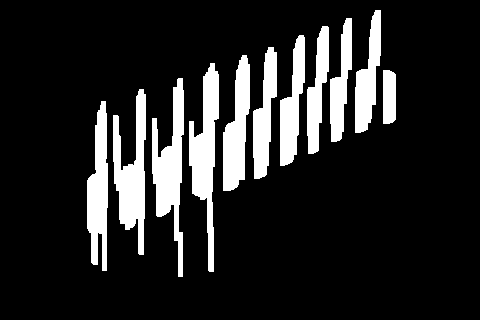

[INFO] 11 unique contours found

Found contours 11


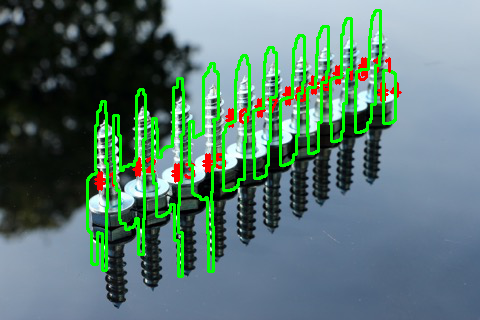

[INFO] 9 unique segments found

Labaled image. Found 9 objects


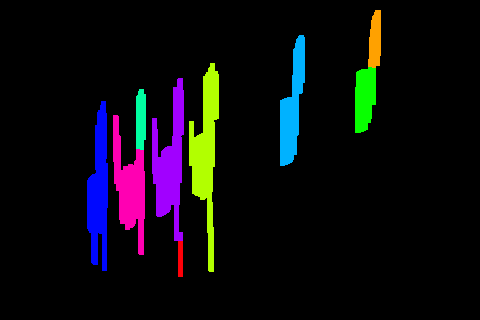

Detected 9 objects by labeled 


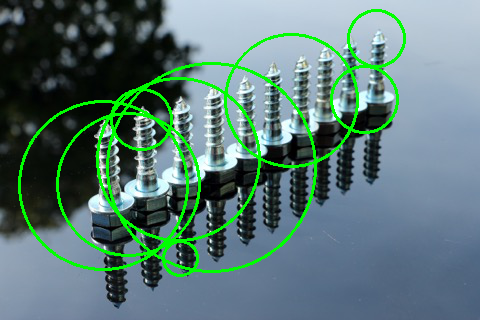

In [235]:
url11 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count11.jpg"
mean_shift_params11 = MeanShiftParameters(5, 20)
parameters11 = Parameters(mean_shift_params=mean_shift_params11, threshold=235, dilate_filter=np.ones((45, 5), np.uint8), min_dist_loacal_max=35)
find_num_objs_process(url11, parameters11)

There are found approximately 11 objects (11 contours, see first method).


#Count12 image



Original image


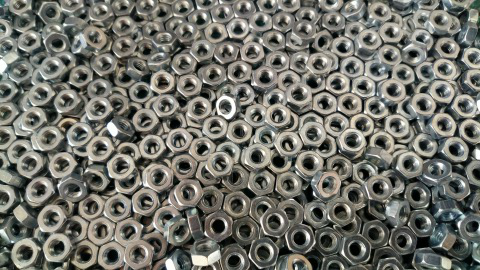


Shifted image


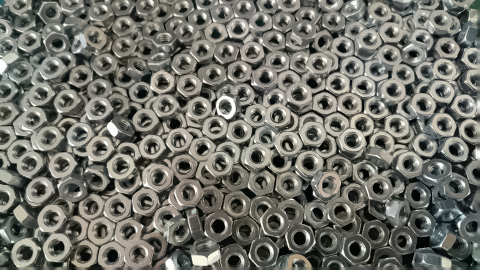


Thresholded image


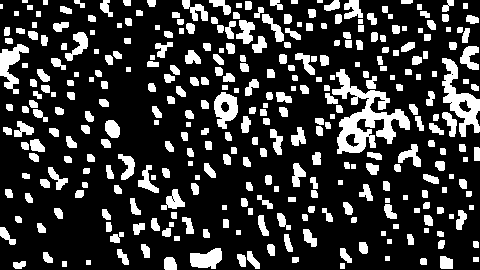

[INFO] 330 unique contours found

Found contours 330


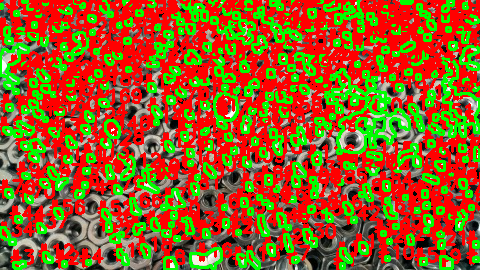

[INFO] 253 unique segments found

Labaled image. Found 253 objects


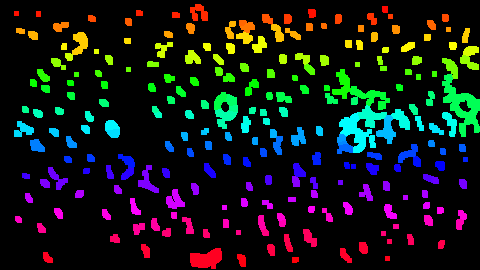

Detected 253 objects by labeled 


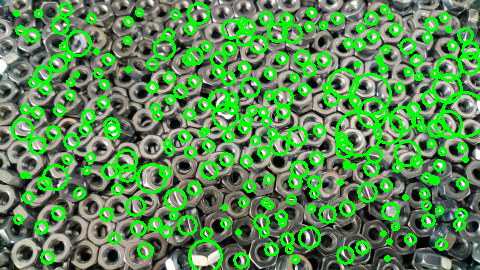

In [240]:
url12 = "https://raw.githubusercontent.com/mdavydov/ComputerVisionCourse/master/tasks/count/count12.jpg"
mean_shift_params12 = MeanShiftParameters(10, 20)
parameters12 = Parameters(mean_shift_params=mean_shift_params12, threshold=200, dilate_filter=np.ones((5, 5), np.uint8), min_dist_loacal_max=10)
find_num_objs_process(url12, parameters12)

There are found 330 objects (330 contours) approximetely.
